In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import *
from matplotlib.pyplot import figure
import numpy as np

In [3]:
#pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
#pd.set_option('display.width', 1000)

In [4]:
Complete_HWC_Data = pd.read_csv("/Users/nerdbear/Downloads/Complete_HWC_Data.csv", index_col=0, dtype=str)


In [5]:
Complete_HWC_Data["Sum of Number of Animals"] = Complete_HWC_Data["Sum of Number of Animals"].astype("float")

Complete_HWC_Data["Total Staff Hours"] = Complete_HWC_Data["Total Staff Hours"].astype("float")

Complete_HWC_Data["Total Staff Involved"] = Complete_HWC_Data["Total Staff Involved"].astype("float")

Complete_HWC_Data["Latitude Public"] = Complete_HWC_Data["Latitude Public"].astype("float")

Complete_HWC_Data["Longitude Public"] = Complete_HWC_Data["Longitude Public"].astype("float")

Complete_HWC_Data[Complete_HWC_Data.columns[20:170]] = Complete_HWC_Data[Complete_HWC_Data.columns[20:170]].astype("float")



In [6]:
Complete_HWC_Data.head()

,UniqueID,Incident Number,Incident Date,Field Unit,Protected Heritage Area,Incident Type,Latitude Public,Longitude Public,Within Park,Total Staff Involved,Total Staff Hours,Species Common Name,Sum of Number of Animals,Animal Health Status,Cause of Animal Health Status,Animal Behaviour,Reason for Animal Behaviour,Animal Attractant,Deterrents Used,Animal Response to Deterrents,Activity Type_Avoidance,Activity Type_Backpacking – Multiday Trips,Activity Type_Beach Recreation,Activity Type_Biking / Walking,Activity Type_Boating - Coastal/Marine,Activity Type_Boating - Commercial,Activity Type_Boating - Motorized Pleasure Craft,Activity Type_Bush Party,Activity Type_Camping - Backcountry,Activity Type_Camping - Frontcountry,Activity Type_Camping - Huts and Lodges,Activity Type_Camping - Winter Frontcountry,Activity Type_Camping-Frontcountry,Activity Type_Canoeing - Flatwater,Activity Type_Canoeing - Swiftwater,Activity Type_Canyoneering,Activity Type_Climbing - Mountaineering,Activity Type_Climbing - Technical Rock,Activity Type_Climbing - Waterfall Ice,Activity Type_Commercial Transportation Operation,Activity Type_Cycling,Activity Type_Cycling - Mountain Biking,Activity Type_Cycling - Road/Shared Path,Activity Type_Cycling - Winter,Activity Type_Docking - TINP Only,Activity Type_Dog Walking,Activity Type_Dogsledding,Activity Type_Domestic Residence Activity,Activity Type_Driving,Activity Type_Field Sports,Activity Type_Fishing,Activity Type_Flight - HETS,Activity Type_Flight - Hang-gliding/Parapenting,Activity Type_Flight - Helicopter,Activity Type_Flight - Sightseeing/Site Access,Activity Type_Golfing,Activity Type_Heritage Activity - Bird Watching,Activity Type_Heritage Activity - History Activities,Activity Type_Heritage Activity - Photography and Art,Activity Type_Heritage Activity - Sightseeing,Activity Type_Heritage Activity - Wildlife Observation,Activity Type_Hiking,Activity Type_Hiking / Walking,Activity Type_Hiking/Walking,Activity Type_Horse Riding - Day Trip,Activity Type_Horse Riding - Multiday,Activity Type_Ice Skating,Activity Type_Kayaking - Coastal,Activity Type_Kayaking - Flatwater,Activity Type_Kayaking - Swiftwater,Activity Type_Mooring,Activity Type_Niking / Walking,Activity Type_Not Applicable,Activity Type_Orienteering / Geocaching,Activity Type_Other,Activity Type_Paddleboarding - Coastal,Activity Type_Paddleboarding - Flatwater,Activity Type_Park Operations,Activity Type_Park Ops - Avalanche Forecasting,Activity Type_Park Ops - Avalanche Control,Activity Type_Park Ops - Search and Rescue,Activity Type_Park Ops - Training,Activity Type_Picknicking / BBQ,Activity Type_Picnicking / BBQ,Activity Type_Picnicking/BBQ,Activity Type_Playground Activities,Activity Type_Rafting - Flatwater,Activity Type_Rafting - Swiftwater,Activity Type_Railway,Activity Type_Research - Scientific/Social,Activity Type_Resource Harvesting - Hunting,Activity Type_Resource Harvesting - Hunting/Fishing/Gathering/Trapping,Activity Type_Roller Sports,Activity Type_Running - Road,Activity Type_Running - Trail,Activity Type_Sail Sports - Wind / Kite Surfing,Activity Type_Scrambling,Activity Type_Sightseeing,Activity Type_Skiing - Crosscountry,Activity Type_Skiing/Boarding - Backcountry,Activity Type_Skiing/Boarding - Ski Resort In Bounds,Activity Type_Skiing/Boarding - Ski Resort Out of Bounds,Activity Type_Sledding/Tobogganning,Activity Type_Snowmobiling,Activity Type_Snowshoeing,Activity Type_Special Event - Participative Audience,Activity Type_Special Events - Passive Audience,Activity Type_Stakeholder Operations,Activity Type_Surfing,Activity Type_Swimming - Cliff Jumping,Activity Type_Swimming - Coastal,Activity Type_Swimming - Facilities,Activity Type_Swimming - Flat Water,Activity Type_Swimming - Swiftwater,Activity Type_Townsite Activity,Activity Type_Tram/Ski Lift/Gondola,Activity Type_Tubing / River Drifting,Activity Type_Unknown,Activity Type_Via-Ferrata,Activity Type_Wiking / Walking,Activity Type_nan,Response Type_Assist Visito

In [128]:
Complete_HWC_Data_Year = Complete_HWC_Data.loc[:, ("Incident Type", "Protected Heritage Area", "Incident Date")]
Complete_HWC_Data_Year["Incident Year"] = pd.to_datetime(Complete_HWC_Data_Year["Incident Date"]).dt.to_period("Y")
Complete_HWC_Data_Year["Incident Year"] = Complete_HWC_Data_Year["Incident Year"].astype("str")
Complete_HWC_Data_Year["Incident Year"] = pd.to_datetime(Complete_HWC_Data_Year["Incident Year"])
Complete_HWC_Data_Year

,Incident Type,Protected Heritage Area,Incident Date,Incident Year
0,Human Wildlife Interaction,Banff National Park of Canada,2010-01-01,2010-01-01
1,Human Wildlife Interaction,Banff National Park of Canada,2010-01-01,2010-01-01
2,Human Wildlife Interaction,Banff National Park of Canada,2010-01-01,2010-01-01
3,Rescued/Recovered/Found Wildlife,Jasper National Park of Canada,2010-01-01,2010-01-01
4,Attractant,Jasper National Park of Canada,2010-01-01,2010-01-01
...,...,...,...,...
73653,Human Wildlife Interaction,Jasper National Park of Canada,2021-12-31,2021-01-01
73654,Human Wildlife Interaction,Jasper National Park of Canada,2021-12-31,2021-01-01
73655,Highway Fence Intrusion,Banff National Park of Canada,2021-06-19,2021-01-01
73656,Rescued/Recovered/Found Wildlife,Prince Edward Island National Park of Canada,2011-07-08,2011-01-01


In [54]:
#Banff Field Unit, Number of Incident Types per year Time Series

Banff_Y = Complete_HWC_Data_Year.loc[Complete_HWC_Data_Year["Protected Heritage Area"]=="Banff National Park of Canada"]

Banff_RRFW_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Rescued/Recovered/Found Wildlife"]
Banff_RRFW_Y_PLOT = Banff_RRFW_Y["Incident Type"].groupby(Banff_RRFW_Y["Incident Year"]).count()

Banff_HWI_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Human Wildlife Interaction"]
Banff_HWI_Y_PLOT = Banff_HWI_Y["Incident Type"].groupby(Banff_HWI_Y["Incident Year"]).count()

Banff_WS_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Wildlife Sighting"]
Banff_WS_Y_PLOT = Banff_WS_Y["Incident Type"].groupby(Banff_WS_Y["Incident Year"]).count()

Banff_MI_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Management Intervention"]
Banff_MI_Y_PLOT = Banff_MI_Y["Incident Type"].groupby(Banff_MI_Y["Incident Year"]).count()

Banff_HFI_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Highway Fence Intrusion"]
Banff_HFI_Y_PLOT = Banff_HFI_Y["Incident Type"].groupby(Banff_HFI_Y["Incident Year"]).count()

Banff_H_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Harassment"]
Banff_H_Y_PLOT = Banff_H_Y["Incident Type"].groupby(Banff_H_Y["Incident Year"]).count()

Banff_A_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Attractant"]
Banff_A_Y_PLOT = Banff_A_Y["Incident Type"].groupby(Banff_A_Y["Incident Year"]).count()

Banff_NW_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Nuisance Wildlife"]
Banff_NW_Y_PLOT = Banff_NW_Y["Incident Type"].groupby(Banff_NW_Y["Incident Year"]).count()

Banff_DA_Y = Banff_Y.loc[Banff_Y["Incident Type"] == "Domestic Animal"]
Banff_DA_Y_PLOT = Banff_DA_Y["Incident Type"].groupby(Banff_DA_Y["Incident Year"]).count()



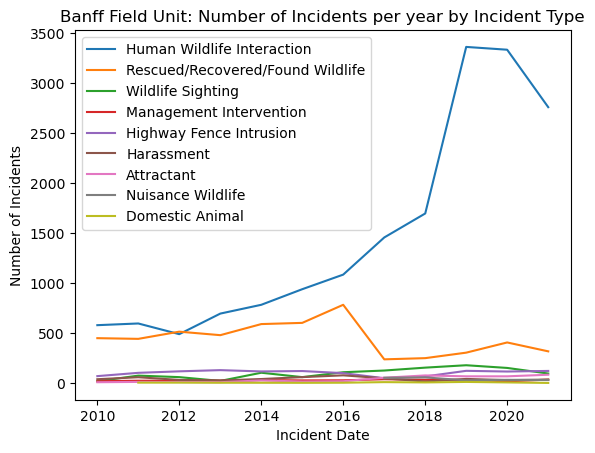

In [55]:
plt.plot(Banff_HWI_Y_PLOT, label = "Human Wildlife Interaction")
plt.plot(Banff_RRFW_Y_PLOT, label = "Rescued/Recovered/Found Wildlife")
plt.plot(Banff_WS_Y_PLOT, label = "Wildlife Sighting")
plt.plot(Banff_MI_Y_PLOT, label = "Management Intervention")
plt.plot(Banff_HFI_Y_PLOT, label = "Highway Fence Intrusion")
plt.plot(Banff_H_Y_PLOT, label = "Harassment")
plt.plot(Banff_A_Y_PLOT, label = "Attractant")
plt.plot(Banff_NW_Y_PLOT, label = "Nuisance Wildlife")
plt.plot(Banff_DA_Y_PLOT, label = "Domestic Animal")
plt.xlabel("Incident Date")
plt.ylabel("Number of Incidents")
plt.legend(loc="upper left")
plt.title("Banff Field Unit: Number of Incidents per year by Incident Type")
plt.show()

In [35]:
Parks = Complete_HWC_Data_Year["Protected Heritage Area"].unique()
for i in Parks: 
    print(i)

Banff National Park of Canada
Jasper National Park of Canada
Pacific Rim National Park Reserve of Canada
Prince Albert National Park of Canada
Waterton Lakes National Park of Canada
Kootenay National Park of Canada
Yoho National Park of Canada
Prince Edward Island National Park of Canada
Kejimkujik National Park and National Historic Site of Canada
Elk Island National Park of Canada
Glacier National Park of Canada
Forillon National Park of Canada
Grasslands National Park of Canada
Terra Nova National Park of Canada
Wood Buffalo National Park of Canada
Wapusk National Park of Canada
Bruce Peninsula National Park of Canada
Mount Revelstoke National Park of Canada
Fundy National Park of Canada
Nahanni National Park Reserve of Canada
Kouchibouguac National Park of Canada
Georgian Bay Islands National Park of Canada
Prince of Wales Fort National Historic Site of Canada
Point Pelee National Park of Canada
Thousand Islands National Park of Canada
Ivvavik National Park of Canada
Port-Royal Nat

In [38]:
IncTypes = Complete_HWC_Data_Year["Incident Type"].unique()
for x in IncTypes: 
    print(x)

Human Wildlife Interaction
Rescued/Recovered/Found Wildlife
Attractant
Domestic Animal
Nuisance Wildlife
Highway Fence Intrusion
Wildlife Sighting
Management Intervention
Harassment


In [72]:
for index, row in Complete_HWC_Data_Year.iterrows():
    print(row)

Incident Type                 Human Wildlife Interaction
Protected Heritage Area    Banff National Park of Canada
Incident Date                                 2010-01-01
Incident Year                        2010-01-01 00:00:00
Name: 0, dtype: object
Incident Type                 Human Wildlife Interaction
Protected Heritage Area    Banff National Park of Canada
Incident Date                                 2010-01-01
Incident Year                        2010-01-01 00:00:00
Name: 1, dtype: object
Incident Type                 Human Wildlife Interaction
Protected Heritage Area    Banff National Park of Canada
Incident Date                                 2010-01-01
Incident Year                        2010-01-01 00:00:00
Name: 2, dtype: object
Incident Type              Rescued/Recovered/Found Wildlife
Protected Heritage Area      Jasper National Park of Canada
Incident Date                                    2010-01-01
Incident Year                           2010-01-01 00:00:00
Name: 3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Incident Type                   Human Wildlife Interaction
Protected Heritage Area    Glacier National Park of Canada
Incident Date                                   2015-07-30
Incident Year                          2015-01-01 00:00:00
Name: 22081, dtype: object
Incident Type                                      Harassment
Protected Heritage Area    Grasslands National Park of Canada
Incident Date                                      2015-07-30
Incident Year                             2015-01-01 00:00:00
Name: 22082, dtype: object
Incident Type              Rescued/Recovered/Found Wildlife
Protected Heritage Area      Jasper National Park of Canada
Incident Date                                    2015-07-30
Incident Year                           2015-01-01 00:00:00
Name: 22083, dtype: object
Incident Type                  Human Wildlife Interaction
Protected Heritage Area    Jasper National Park of Canada
Incident Date                                  2015-07-30
Incident Year        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Incident Type              Rescued/Recovered/Found Wildlife
Protected Heritage Area       Banff National Park of Canada
Incident Date                                    2019-06-19
Incident Year                           2019-01-01 00:00:00
Name: 46128, dtype: object
Incident Type                                        Wildlife Sighting
Protected Heritage Area    Pacific Rim National Park Reserve of Canada
Incident Date                                               2019-06-19
Incident Year                                      2019-01-01 00:00:00
Name: 46129, dtype: object
Incident Type                                   Wildlife Sighting
Protected Heritage Area    Waterton Lakes National Park of Canada
Incident Date                                          2019-06-19
Incident Year                                 2019-01-01 00:00:00
Name: 46130, dtype: object
Incident Type                                   Wildlife Sighting
Protected Heritage Area    Waterton Lakes National Park of Canada

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Incident Type                  Human Wildlife Interaction
Protected Heritage Area    Jasper National Park of Canada
Incident Date                                  2021-08-16
Incident Year                         2021-01-01 00:00:00
Name: 70170, dtype: object
Incident Type                  Human Wildlife Interaction
Protected Heritage Area    Jasper National Park of Canada
Incident Date                                  2021-08-16
Incident Year                         2021-01-01 00:00:00
Name: 70171, dtype: object
Incident Type                  Human Wildlife Interaction
Protected Heritage Area    Jasper National Park of Canada
Incident Date                                  2021-08-16
Incident Year                         2021-01-01 00:00:00
Name: 70172, dtype: object
Incident Type                  Human Wildlife Interaction
Protected Heritage Area    Jasper National Park of Canada
Incident Date                                  2021-08-16
Incident Year                         2021-01-01 

In [83]:
Banff = pd.DataFrame()
for i in Parks:
    Banff[i] = i

Banff
    

,Banff National Park of Canada,Jasper National Park of Canada,Pacific Rim National Park Reserve of Canada,Prince Albert National Park of Canada,Waterton Lakes National Park of Canada,Kootenay National Park of Canada,Yoho National Park of Canada,Prince Edward Island National Park of Canada,Kejimkujik National Park and National Historic Site of Canada,Elk Island National Park of Canada,Glacier National Park of Canada,Forillon National Park of Canada,Grasslands National Park of Canada,Terra Nova National Park of Canada,Wood Buffalo National Park of Canada,Wapusk National Park of Canada,Bruce Peninsula National Park of Canada,Mount Revelstoke National Park of Canada,Fundy National Park of Canada,Nahanni National Park Reserve of Canada,Kouchibouguac National Park of Canada,Georgian Bay Islands National Park of Canada,Prince of Wales Fort National Historic Site of Canada,Point Pelee National Park of Canada,Thousand Islands National Park of Canada,Ivvavik National Park of Canada,Port-Royal National Historic Site of Canada,Fort Livingstone National Historic Site of Canada,Fathom Five National Marine Park of Canada,Saoyú-?ehdacho National Historic Site of Canada,Aulavik National Park of Canada,Sable Island National Park Reserve,York Factory National Historic Site of Canada,Fort Walsh National Historic Site of Canada,Thaidene Nene National Park Reserve


In [106]:
Banff = pd.DataFrame(columns = ["Incident Date","Protected Heritage Area"])
for i in Parks:
    Banff.loc[index, "Protected Heritage Area"]= i
Banff

,Incident Date,Protected Heritage Area
73657,NaN,Thaidene Nene National Park Reserve


In [108]:
Banff = pd.DataFrame(columns = ["Incident Date","Protected Heritage Area"])

for index, row in Complete_HWC_Data_Year.iterrows():
    Banff.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]

Banff
    

,Incident Date,Protected Heritage Area
0,NaN,Banff National Park of Canada
1,NaN,Banff National Park of Canada
2,NaN,Banff National Park of Canada
3,NaN,Jasper National Park of Canada
4,NaN,Jasper National Park of Canada
...,...,...
73653,NaN,Jasper National Park of Canada
73654,NaN,Jasper National Park of Canada
73655,NaN,Banff National Park of Canada
73656,NaN,Prince Edward Island National Park of Canada


In [111]:
Banff = pd.DataFrame(columns = ["Incident Date","Protected Heritage Area"])

for index, row in Complete_HWC_Data_Year.iterrows():
    if row["Protected Heritage Area"] == "Banff National Park of Canada":
        Banff.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]

Banff

,Incident Date,Protected Heritage Area
0,NaN,Banff National Park of Canada
1,NaN,Banff National Park of Canada
2,NaN,Banff National Park of Canada
7,NaN,Banff National Park of Canada
9,NaN,Banff National Park of Canada
...,...,...
73635,NaN,Banff National Park of Canada
73636,NaN,Banff National Park of Canada
73652,NaN,Banff National Park of Canada
73655,NaN,Banff National Park of Canada


In [129]:
Banff = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Jasper = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PacificRim = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PrinceAlbert = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
WatertonLakes = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Kootenay = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Yoho = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PrinceEdward = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Kejimkujik = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
ElkIsland = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Glacier = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Forillon = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Grasslands = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
TerraNova = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
WoodBuffalo = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Wapusk = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
BrucePeninsula = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
MountRevelstoke = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Fundy = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Nahanni = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Kouchibouguac = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
GeorgianBay = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PrinceOfWales = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PointPelee = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
ThousandIslands = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Ivvavik = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
PortRoyal = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
FortLivingstone = pd.DataFrame(columns = ["Incident DaYearte","Protected Heritage Area", "Incident Type"])
FathomFive = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Saoyu = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
Aulavik = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
SableIsland = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
YorkFactory = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
FortWalsh = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
ThaideneNene = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])


for index, row in Complete_HWC_Data_Year.iterrows(): 
    if row["Protected Heritage Area"] == "Banff National Park of Canada":
        Banff.loc[index, ("Incident Year","Protected Heritage Area", "Incident Type")] = row
    elif row["Protected Heritage Area"] == "Jasper National Park of Canada":
        Jasper.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]
    elif row["Protected Heritage Area"] == "Pacific Rim National Park Reserve of Canada":
        PacificRim.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]
    elif row["Protected Heritage Area"] == "Prince Albert National Park of Canada":
        PrinceAlbert.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]
    elif row["Protected Heritage Area"] == "Waterton Lakes National Park of Canada":
        WatertonLakes.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]

Banff

,Incident Year,Protected Heritage Area,Incident Type
0,2010-01-01 00:00:00,Banff National Park of Canada,Human Wildlife Interaction
1,2010-01-01 00:00:00,Banff National Park of Canada,Human Wildlife Interaction
2,2010-01-01 00:00:00,Banff National Park of Canada,Human Wildlife Interaction
7,2010-01-01 00:00:00,Banff National Park of Canada,Rescued/Recovered/Found Wildlife
9,2010-01-01 00:00:00,Banff National Park of Canada,Rescued/Recovered/Found Wildlife
...,...,...,...
73635,2021-01-01 00:00:00,Banff National Park of Canada,Human Wildlife Interaction
73636,2021-01-01 00:00:00,Banff National Park of Canada,Human Wildlife Interaction
73652,2021-01-01 00:00:00,Banff National Park of Canada,Attractant
73655,2021-01-01 00:00:00,Banff National Park of Canada,Highway Fence Intrusion


In [139]:
df = pd.DataFrame(columns = ["Incident Year","Protected Heritage Area", "Incident Type"])
years = ["2010-01-01 00:00:00", "2011-01-01 00:00:00", "2012-01-01 00:00:00", "2013-01-01 00:00:00", "2014-01-01 00:00:00", "2015-01-01 00:00:00", "2016-01-01 00:00:00", "2017-01-01 00:00:00", "2018-01-01 00:00:00", "2019-01-01 00:00:00", "2020-01-01 00:00:00", "2021-01-01 00:00:00"]
YearCounts = pd.DataFrame(years, columns = ["Incident Year"])

for i in Parks: 
    for index, row in Complete_HWC_Data_Year.iterrows(): 
        if row["Protected Heritage Area"] == i:
            if row["Incident Type"] == "Rescued/Recovered/Found Wildlife":
                df.loc[index, ("Incident Date","Protected Heritage Area", "Incident Type")] = row
                print(df)
                break
                YearCounts.loc[index, "Rescued/Recovered/Found Wildlife"] = x                

#df["Incident Type"].groupby(df["Incident Year"]).count()
                


  Incident Year        Protected Heritage Area  \
7           NaN  Banff National Park of Canada   

                      Incident Type Incident Date  
7  Rescued/Recovered/Found Wildlife    2010-01-02  
  Incident Year         Protected Heritage Area  \
7           NaN   Banff National Park of Canada   
3           NaN  Jasper National Park of Canada   

                      Incident Type Incident Date  
7  Rescued/Recovered/Found Wildlife    2010-01-02  
3  Rescued/Recovered/Found Wildlife    2010-01-01  
    Incident Year                      Protected Heritage Area  \
7             NaN                Banff National Park of Canada   
3             NaN               Jasper National Park of Canada   
163           NaN  Pacific Rim National Park Reserve of Canada   

                        Incident Type Incident Date  
7    Rescued/Recovered/Found Wildlife    2010-01-02  
3    Rescued/Recovered/Found Wildlife    2010-01-01  
163  Rescued/Recovered/Found Wildlife    2010-03-13  
    

In [ ]:
Banff = pd.DataFrame(columns = ["Incident Date","Protected Heritage Area"])

for index, row in Complete_HWC_Data_Year.iterrows():
    for i in Parks: 
        if row["Protected Heritage Area"] == i:
            Banff.loc[index, "Protected Heritage Area"] = row["Protected Heritage Area"]

Banff

In [ ]:
### trash 
Banff = pd.DataFrame(columns = "Protected Heritage Area")
for i in Parks:
    for index, row in Complete_HWC_Data_Year.iterrows():
    Banff[i] = i

Banff

In [66]:
df=pd.DataFrame()

for x in range(len(Complete_HWC_Data_Year):
    for i in Parks: 
        if x["Protected Heritage Area"]=="i":
            df.append(x)
            print(df)
              
        
#for index, row in Complete_HWC_Data_Year.iterrows(): 
#    for i in Parks: 
#        if Complete_HWC_Data_Year["Protected Heritage Area"]=="i"
               
        
#    i_Y = Complete_HWC_Data_Year.loc[Complete_HWC_Data_Year["Protected Heritage Area"]=="i"]
#    print(i_Y)
#    for x in IncTypes:
#       i_x_Y = i_Y.loc[Complete_HWC_Data_Year["Incident Type"] == "x"]
#        print(i_x_Y.head())
    
    #Banff_RRFW_Y_PLOT = Banff_RRFW_Y["Incident Type"].groupby(Banff_RRFW_Y["Incident Year"]).count()


SyntaxError: invalid syntax (2580293669.py, line 3)